# Day 23: ICA: Neural Style Transfer

### <p style='text-align: right;'> &#9989; Aditya Dhaka
#### <p style='text-align: right;'> &#9989; Group 2: Dilan, Jacob, Rui, Salau


<img src= "https://i.redd.it/sxlw9hbcj8841.jpg" width="80%"/>

From: [Reddit](https://www.reddit.com/r/Breath_of_the_Wild/comments/eio394/botw_x_starry_night_neural_style_transfer/)

This assignment is modified from the [Pytorch tutorial](https://pytorch.org/tutorials/advanced/neural_style_tutorial.html). A related implementation using Tensorflow is [here](https://www.tensorflow.org/tutorials/generative/style_transfer).

## ___Learning objectives___

At the end of the exercise, you should be able to:
- Load and use a pre-trained CNN model.
- Use feature map from CNN for neural style transfer.
- Explain how neural style transfer works.

---
## ___Outline___

1. [Two ways to create ANN in Pytorch](#ways)
1. [VGG19 for classification](#vgg19)
1. [Neural style transfer with VGG19](#nst)
1. [Apply the approaches on your own images](#apply)

---
## ___Setup___

In [54]:
import copy
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
from torchvision.models import vgg19, VGG19_Weights
from torchsummary import summary

import numpy as np
from helper_d25 import load_image, show_image, get_imagenet_classes

In [55]:
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device = torch.device("cpu")

device

device(type='cpu')

----
<a id="ways"></a>
## ___Two ways to create ANN with Pytorch___

### _Using `nn.Module`_

This is what we have been using so far. You must be very familiar with it.

🗒️ **Task:** Run the following cell to create a 3x2x1 neural net.

In [52]:
class Classifier_module(nn.Module):
  def __init__(self):
    super().__init__()
    self.fc1 = nn.Linear(32*32*3,300)
    self.fc2 = nn.Linear(300,100)
    self.fc3 = nn.Linear(100,10)
    
  def forward(self,x):
    type(x)
    x = x.view(x.shape[0],-1)
    type(x)
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))
    x = F.relu(self.fc3(x))
    x = F.log_softmax(x,dim=1)
    return x

model_module = Classifier_module()

print(summary(model_module,(3,32,32)))

Layer (type:depth-idx)                   Output Shape              Param #
├─Linear: 1-1                            [-1, 300]                 921,900
├─Linear: 1-2                            [-1, 100]                 30,100
├─Linear: 1-3                            [-1, 10]                  1,010
Total params: 953,010
Trainable params: 953,010
Non-trainable params: 0
Total mult-adds (M): 0.95
Input size (MB): 0.01
Forward/backward pass size (MB): 0.00
Params size (MB): 3.64
Estimated Total Size (MB): 3.65
Layer (type:depth-idx)                   Output Shape              Param #
├─Linear: 1-1                            [-1, 300]                 921,900
├─Linear: 1-2                            [-1, 100]                 30,100
├─Linear: 1-3                            [-1, 10]                  1,010
Total params: 953,010
Trainable params: 953,010
Non-trainable params: 0
Total mult-adds (M): 0.95
Input size (MB): 0.01
Forward/backward pass size (MB): 0.00
Params size (MB): 3.64
Estimated To

### _Using `nn.Sequential`_

🗒️ **Task:** With some sacrifice of the flexibility but with quite a bit less code, the same network can be created via the `nn.Sequential` module:

In [53]:
import torch.nn as nn
model_seq  = nn.Sequential(nn.Flatten(),
                           nn.Linear(32**2*3,300),
                           nn.ReLU(),
                           nn.Linear(300,100),
                           nn.ReLU(),
                           nn.Linear(100,10),
                           nn.Softmax())

print(summary(model_seq,(3,32,32)))

Layer (type:depth-idx)                   Output Shape              Param #
├─Flatten: 1-1                           [-1, 3072]                --
├─Linear: 1-2                            [-1, 300]                 921,900
├─ReLU: 1-3                              [-1, 300]                 --
├─Linear: 1-4                            [-1, 100]                 30,100
├─ReLU: 1-5                              [-1, 100]                 --
├─Linear: 1-6                            [-1, 10]                  1,010
├─Softmax: 1-7                           [-1, 10]                  --
Total params: 953,010
Trainable params: 953,010
Non-trainable params: 0
Total mult-adds (M): 0.95
Input size (MB): 0.01
Forward/backward pass size (MB): 0.00
Params size (MB): 3.64
Estimated Total Size (MB): 3.65
Layer (type:depth-idx)                   Output Shape              Param #
├─Flatten: 1-1                           [-1, 3072]                --
├─Linear: 1-2                            [-1, 300]               

### _Adding additional layers to an existing neural net_

🗒️ **Task:** Conveniently, after the model is created, you can still add new layers to it. Say we want to append a ReLU layer to the end of the network `model_seq`, then we only need to issue the following command. Run it to add the new layer.

In [5]:
model_seq.add_module('ReLU',nn.ReLU())

print(model_seq)

Sequential(
  (0): Flatten(start_dim=1, end_dim=-1)
  (1): Linear(in_features=3072, out_features=300, bias=True)
  (2): ReLU()
  (3): Linear(in_features=300, out_features=100, bias=True)
  (4): ReLU()
  (5): Linear(in_features=100, out_features=10, bias=True)
  (6): Softmax(dim=None)
  (ReLU): ReLU()
)


### _Adding a custom layer_

A layer is a **class object**. 
- A neural network is a sequence of class objects. 
- The network itself is a class object (the definition of object is just flexible enough to allow a list of objects to be an object itself).

🗒️ **Task:** We can define customized layers to add to the network. For example:
  - Define a layer that centralizes the input, i.e., subtracting the mean of the input from each entry. 
  - Append the custom layer to the model.

In [6]:
class Centralization_layer(nn.Module):
  def __init__(self): 
    super().__init__()

  def forward(self,x): #x is the input of this layer
    return x - x.mean() #What does this line do?
  
model_seq.add_module('Centralization',Centralization_layer())

print(model_seq)

Sequential(
  (0): Flatten(start_dim=1, end_dim=-1)
  (1): Linear(in_features=3072, out_features=300, bias=True)
  (2): ReLU()
  (3): Linear(in_features=300, out_features=100, bias=True)
  (4): ReLU()
  (5): Linear(in_features=100, out_features=10, bias=True)
  (6): Softmax(dim=None)
  (ReLU): ReLU()
  (Centralization): Centralization_layer()
)


---
<a id="vgg19"></a>
## ___VGG19___

### _Model architecture_

[Optional: VGGNet Architecture Explained](https://medium.com/analytics-vidhya/vggnet-architecture-explained-e5c7318aa5b6)

🗒️ **Task:** Here, we will be using pre-trained [VGG19](https://pytorch.org/vision/main/models/generated/torchvision.models.vgg19.html#torchvision.models.vgg19), retain part of it, for neural style transfer. First, let's load VGG19 and check out the model architecture.

In [7]:
VGG19 = vgg19(weights=VGG19_Weights.DEFAULT).to(device).eval()

print(VGG19)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

### _VGG19 for classification_

🗒️ **Task:** Let's load and show the content and style images that will be used throughout this exercise:

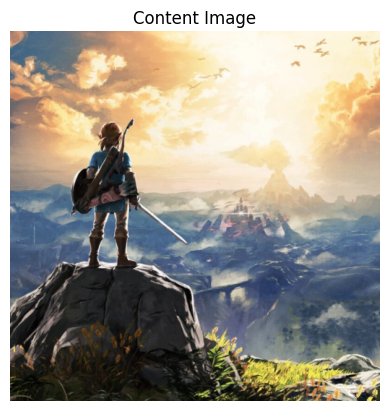

In [8]:
content_url = 'https://cdn.wccftech.com/wp-content/uploads/2017/01/Zelda-Breath-of-the-Wild-screenshots6-1480x802.jpg'
content_img = load_image(content_url, device=device)
show_image(content_img.detach().cpu(),'Content Image')

🗒️ **Task:** Since VGG19 is an object-detection and classification model, let's see what object is detected in the content image:

- Run the code below,
- Provide comments as indicated.

In [9]:
# Pass the content image through the VGG19 model for prediction.
content_pred = VGG19(content_img)

# Detach the tensor from the computation graph, move it to the CPU, and convert it to a NumPy array.
content_pred_numpy = content_pred.detach().cpu().numpy()

# Print the shape of the output to understand the dimensions of the predicted result.
content_pred_numpy.shape

(1, 1000)

🗒️ **Task:** Write code to print out the class labels and class names of the top 5 predictions using:

- `content_pred_numpy`
- The helper function `get_imagenet_classes` that will return a dictionary where the class labels are the keys and the class names as values.

In [10]:
# Get the ImageNet class labels and names
class_names = get_imagenet_classes()

# Get the top 5 predictions by sorting the probabilities
top5_preds = np.argsort(content_pred_numpy[0])[-5:][::-1]  # Sort and get top 5 predictions

# Print the class labels and class names of the top 5 predictions
for idx in top5_preds:
    class_label = idx
    class_name = class_names[class_label]
    print(f"Class Label: {class_label}, Class Name: {class_name}")


Class Label: 970, Class Name: alp
Class Label: 980, Class Name: volcano
Class Label: 701, Class Name: parachute, chute
Class Label: 972, Class Name: cliff, drop, drop-off
Class Label: 979, Class Name: valley, vale


🗒️ **Task:** Write code below to:

- Create an `style_img` object like `content_img` that is the resized style image.
- Predict and print out the top 5 classes of the style image. 

In [11]:
style_url = "https://m.media-amazon.com/images/I/71pzSa3-euL._AC_SL1000_.jpg"

# Load the style image
style_img = load_image(style_url, device=device)

# Pass the style image through the VGG19 model for prediction
style_pred = VGG19(style_img)

# Detach the tensor, move it to CPU, and convert it to a NumPy array
style_pred_numpy = style_pred.detach().cpu().numpy()

# Sort the predictions and get the top 5 class labels and names
top5_style_indices = np.argsort(style_pred_numpy[0])[::-1][:5]

# Get the ImageNet class names
imagenet_classes = get_imagenet_classes()

# Print the top 5 predictions
print("Top 5 predictions for the style image:")
for idx in top5_style_indices:
    class_label = idx
    class_name = imagenet_classes[class_label]
    print(f"Class Label: {class_label}, Class Name: {class_name}")


Top 5 predictions for the style image:
Class Label: 977, Class Name: sandbar, sand bar
Class Label: 669, Class Name: mosquito net
Class Label: 337, Class Name: beaver
Class Label: 203, Class Name: West Highland white terrier
Class Label: 750, Class Name: quilt, comforter, comfort, puff


🗒️ **Question:** Do the predictions make sense? What does the above tell you about classifying something when the class labels do not exist?

✏️ **Answer:** *The predictions seem nonsensical because they reflect the model's inability to recognize the actual content of the style image, highlighting the challenges of classification when the training data does not represent the target content.*

----
<a id="nst"></a>
## ___Content and style representation___

We will be using VGG19 as the base model for neural style transfer.

### _Feature maps and representation of contents_

Here is a picture of a cat:

<img src="https://miro.medium.com/v2/resize:fit:786/format:webp/1*H3E66N_7umdrobakY-wG4A@2x.png" width=200>

Feature maps:
- The outputs after applying the filters (kernels) on the input cat image.
- Each map would capture different "aspects" of the cat imge:
- Below are the feature maps from different convolution layers when passing the cat image:

<img src="https://miro.medium.com/v2/resize:fit:1400/format:webp/1*OuxhgVj1WDDfo5UO5GIhgA@2x.png" width="90%">

From [Arden Dertat's article in Towards Data Science](https://towardsdatascience.com/applied-deep-learning-part-4-convolutional-neural-networks-584bc134c1e2)

🗒️ **Question:** Based on the result above, which feature map may better represent the content of the original image?

✏️ **Answer:** *block1_conv1 and block2_conv1 better represents the content of the original image*

### _Define loss functions_

The style transfer is formulated as:
- An optimization problem that minimizes a weighted sum of:
  - The style loss and
  - The content loss. 
- We need to define the two loss functions first. Below we define the losses as class objects, so that they can be conveniently incorporated as layers of the network. 

🗒️ **Task:** Please read through the code for defining content loss and get a sense what it is doing and provide comments as indicated.

In [12]:
class ContentLoss(nn.Module):

  def __init__(self, target,):
    super(ContentLoss, self).__init__()
    
    # The target content (from the content image) is detached from the computation graph.
    # This ensures that the target content is not updated during backpropagation,
    # only the input (the generated image) will be updated.
    self.target = target.detach() 

  def forward(self, input):
    # The loss is computed as the Mean Squared Error (MSE) between the input (generated image)
    # and the target (content image). This measures the difference in content features.
    self.loss = F.mse_loss(input, self.target) 

    return input  # Return the input tensor so that the forward pass continues


🗒️ **Task:** Please read through the code for defining style loss and get a sense how it is different from content loss.

In [13]:
class StyleLoss(nn.Module):

  def __init__(self, target_feature):
    super(StyleLoss, self).__init__()
    self.target = gram_matrix(target_feature).detach()

  def forward(self, input):
    G = gram_matrix(input)

    self.loss = F.mse_loss(G, self.target) 
    return input

### _Image style and Gram matrix_

The style of an image can be described by the __correlations__ between the different feature maps.
* This correlations between feature map can be calculated as a [Gram matrix](http://mlwiki.org/index.php/Gram_Matrices) which is used later for the content image to adopt the styles.

🗒️ **Task:** Below is the `gram_matrix` function. Run the cell.

In [14]:
def gram_matrix(input):
  '''Generate Gram matrix'''

  # Get the dimensions of the input tensor
  # a = batch size, b = number of feature maps, c = height, d = width of the feature map
  a, b, c, d = input.size()

  # Reshape the input tensor into 2D by flattening the height and width dimensions
  # Now features will have the shape (a * b, c * d), i.e., each column represents a spatial location in the feature map
  features = input.view(a * b, c * d)  

  # Compute the Gram matrix by multiplying the feature matrix with its transpose
  # This calculates the pairwise correlations between feature maps across the spatial dimensions
  G = torch.mm(features, features.t())  

  # Normalize the Gram matrix by dividing by the total number of elements (to keep it scale-invariant)
  G_norm = G.div(a * b * c * d)

  return G_norm


### _Layers representing styles_

What we are interested here is __not__ in classifying images with VGG19, but in using the learned weights in VGG to help us get stylized images.

To do so, there is the proposal that:
- The content information is available at __the earlier convolution laryer of the last block__ in VGG19.
  - Take a look at the feature maps for cat!
  - Note that VGG19 organized in `Conv2Ds+Maxpooling` blocks.
  - We will use the __2nd__ convolution layer to represent content.

🗒️ **Question:** Above we decide to use an early layer to represent content How about style? Take a look at the learned filters in VGG19 from the earlier vs the later layers:

__Block 1 - convolution 2__

<img src="https://miro.medium.com/v2/resize:fit:1400/format:webp/1*67eDFN3-TzDZFF0ndzGKwQ@2x.png" width="50%"/>

__Block 5 - convolution 3__

<img src="https://miro.medium.com/v2/resize:fit:1400/format:webp/1*w41F9cu7vnvts1e06VoK0A@2x.png" width="50%"/>

Based on the above, how should we represent styles in the style image and why?

✏️ **Answer:** *Style should be represented using the later convolution layers (e.g., Block 5, Conv3) because they capture more abstract, high-level features that are crucial for texture and style representation.*

## ___Neural style transfer in action___

### _Get VGG19 features_

As discussed above, a Sequential module contains an ordered list of layers. For instance, `vgg19.features` contains a sequence convolution blocks (Conv2d, ReLU, MaxPool2d, Conv2d, ReLU…) aligned in the right order of depth and does not include the fully connected layers. 

🗒️ **Task:** Run the following to get `cnn` that contains the convolution parts of VGG19 and set it to be evaluated (instead of training).

In [15]:
cnn = vgg19(weights=VGG19_Weights.DEFAULT).features.eval()

### _Define the normalization layer_

To use VGG19, we need to first preprocess the input images in a way that VGG19 expects. This is true for any other pretrained network: if you want to use it, you need to make sure the input data will work for it.

VGG networks are trained on images with each channel normalized by:
- Chanel means $\mu=[0.485, 0.456, 0.406]$ 
- Standard deviation $\sigma=[0.229, 0.224, 0.225]$. 
- We will use them to normalize the image before sending it into layers of the network.

🗒️ **Task:** Run the following to get the normalization layer.

In [16]:
normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
normalization_std  = torch.tensor([0.229, 0.224, 0.225]).to(device)

class Normalization(nn.Module):
  '''Define a layer to normalize the input image'''

  def __init__(self, mean, std):
    super(Normalization, self).__init__()

    # comment: what does .view(-1, 1, 1) do?
    self.mean = mean.clone().detach().view(-1, 1, 1) 
    self.std  = std.clone().detach().view(-1, 1, 1) 

    # older code with warning
    #self.mean = torch.tensor(mean).view(-1, 1, 1) 
    #self.std = torch.tensor(std).view(-1, 1, 1) 

  def forward(self, img):
    '''Apply the normalization scheme'''
    return (img - self.mean) / self.std

### _Get a new models with the desired layers and determine losses_ 

When using vgg19 for the purpose of style transfer, we only need a subset of layers, so we create a new model that contains the layers we need along with the content loss and style loss layers that measures the dissimilarity of the input image and the targets with the goal to minimize the losses.

🗒️ **Task:** Run the following to define layers to represent content and styles, respectively.

In [17]:
content_layers_default = ['conv_2']
style_layers_default   = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']


🗒️ **Task:** The following code defines the new model and determine losses. Provide docstring and discuss with your neighbor if you encounter a line that does not make sense.

In [18]:
def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                                style_img, content_img,
                                content_layers=content_layers_default,
                                style_layers=style_layers_default):
  '''Creates a style transfer model with content and style loss layers.
  
  Args:
    cnn (nn.Module): Pre-trained CNN model (e.g., VGG19).
    normalization_mean (torch.Tensor): Mean values for normalizing images.
    normalization_std (torch.Tensor): Standard deviation values for normalizing images.
    style_img (torch.Tensor): The style image tensor.
    content_img (torch.Tensor): The content image tensor.
    content_layers (list of str): List of layer names for content loss.
    style_layers (list of str): List of layer names for style loss.
  
  Returns:
    model (nn.Module): The model with content/style loss layers.
    style_losses (list): List of style loss layers.
    content_losses (list): List of content loss layers.
  '''
  
  # normalization module
  normalization = Normalization(normalization_mean, normalization_std)

  # just in order to have an iterable access to or list of content/style
  # losses
  content_losses = []
  style_losses = []

  # assuming that ``cnn`` is a ``nn.Sequential``, so we make a new 
  # ``nn.Sequential`` to put in modules that are supposed to be activated 
  # sequentially
  model = nn.Sequential(normalization)

  i = 0  # increment every time we see a conv
  for layer in cnn.children():
    if isinstance(layer, nn.Conv2d):
      i += 1
      name = 'conv_{}'.format(i)
    elif isinstance(layer, nn.ReLU):
      name = 'relu_{}'.format(i)
      # The in-place version doesn't play very nicely with the ``ContentLoss``
      # and ``StyleLoss`` we insert below. So we replace with out-of-place
      # ones here.
      layer = nn.ReLU(inplace=False)
    elif isinstance(layer, nn.MaxPool2d):
      name = 'pool_{}'.format(i)
    elif isinstance(layer, nn.BatchNorm2d):
      name = 'bn_{}'.format(i)
    else:
      raise RuntimeError(f'Unrecognized layer: {layer.__class__.__name__}')

    model.add_module(name, layer)

    if name in content_layers:
      # add content loss:
      target = model(content_img).detach()
      content_loss = ContentLoss(target)
      model.add_module("content_loss_{}".format(i), content_loss)
      content_losses.append(content_loss)

    if name in style_layers:
      # add style loss:
      target_feature = model(style_img).detach()
      style_loss = StyleLoss(target_feature)
      model.add_module("style_loss_{}".format(i), style_loss)
      style_losses.append(style_loss)

  # now we trim off the layers after the last content and style losses
  for i in range(len(model) - 1, -1, -1):
    if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
      break

  model = model[:(i + 1)]

  return model, style_losses, content_losses

### _Initialize model and get losses_ 

🗒️ **Task:** Run the following to get the extracted VGG19 model, content losses, and style losses.

In [19]:
input_img = content_img.clone()

model, style_losses, content_losses = get_style_model_and_losses(
                                                 cnn,
                                                 normalization_mean, 
                                                 normalization_std, 
                                                 style_img, input_img)

print(model)

Sequential(
  (0): Normalization()
  (conv_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_1): StyleLoss()
  (relu_1): ReLU()
  (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (content_loss_2): ContentLoss()
  (style_loss_2): StyleLoss()
  (relu_2): ReLU()
  (pool_2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_3): StyleLoss()
  (relu_3): ReLU()
  (conv_4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_4): StyleLoss()
  (relu_4): ReLU()
  (pool_4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_5): StyleLoss()
)


🗒️ **Task:** Run the following cell and explain the outputs as comments

In [20]:
# comment: why the number?
print(len(style_losses))  # Output: 5
# The number 5 indicates that there are 5 layers in the model that contribute to the style loss. 
# Each of these layers is selected to capture different aspects of the style features of the image during the style transfer process.

print(type(style_losses[0]))  # Output: <class '__main__.StyleLoss'>
# The type of the first element in the 'style_losses' list is <class '__main__.StyleLoss'>, 
# which means that the elements of the 'style_losses' list are instances of the 'StyleLoss' class. 
# This class is responsible for computing the style loss at each specified layer of the model.

# comment: why the number?
print(len(content_losses))  # Output: 1
# The number 1 indicates that there is only 1 layer in the model that contributes to the content loss.
# Typically, the content loss is computed at one layer of the model, which captures the high-level content features of the image.

print(type(content_losses[0]))  # Output: <class '__main__.ContentLoss'>
# The type of the first element in the 'content_losses' list is <class '__main__.ContentLoss'>, 
# meaning that the elements in the 'content_losses' list are instances of the 'ContentLoss' class. 
# This class is responsible for computing the content loss, which is the difference between the features of the generated image and the content image.


5
<class '__main__.StyleLoss'>
1
<class '__main__.ContentLoss'>


🗒️ **Task:** Ask AI to make a diagram of this transfer model so that you can get a better picture. In the cell below paste the diagram


✏️ **Answer:**

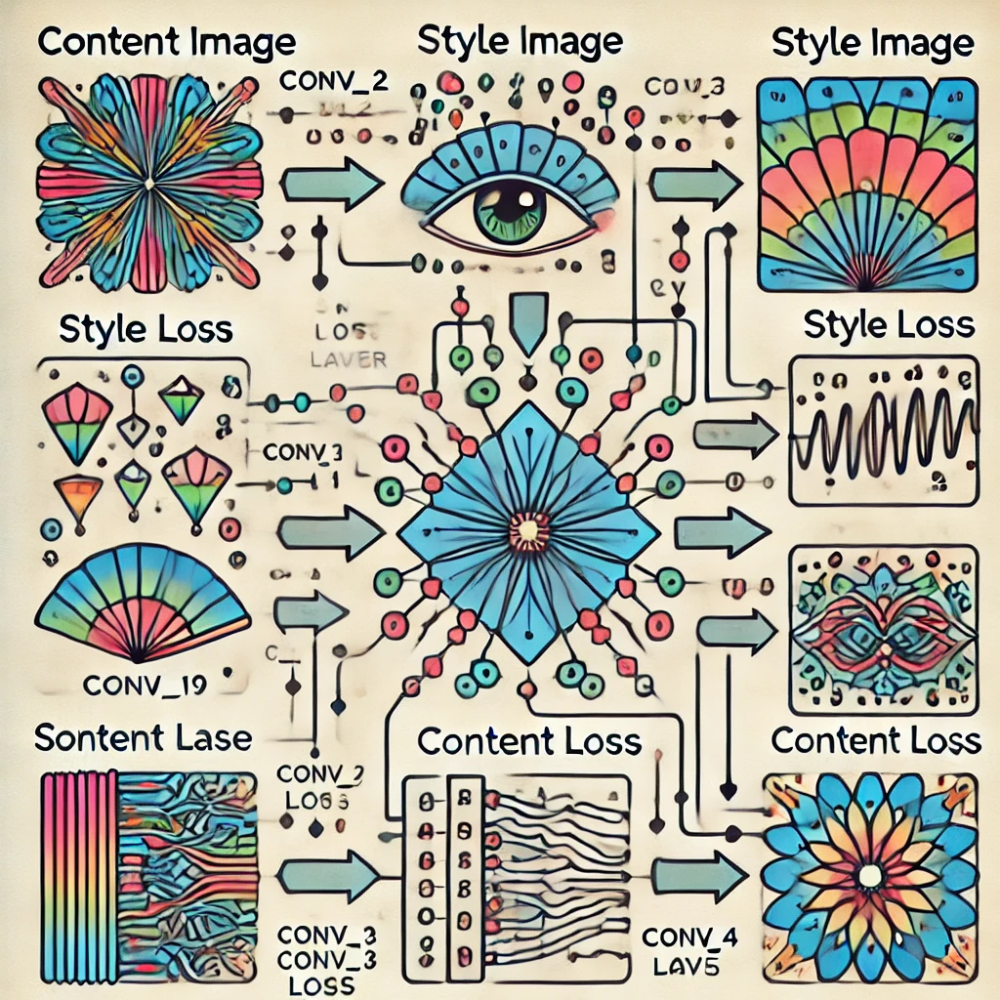

### _Define and initialize optimizer_ 

🗒️ **Task:** We will use the LBFGS optimizer here.

In [21]:
def get_input_optimizer(input_img):
  # this line to show that input is a parameter that requires a gradient
  optimizer = optim.LBFGS([input_img])
  return optimizer

🗒️ **Task:** Run the following and comment on the lines.

In [22]:
# comment: Enable gradient computation for the input image
input_img.requires_grad_(True)

# comment: Set the model to evaluation mode (no gradient updates during forward pass)
model.eval()

# comment: Disable gradient computation for the model (weights not updated)
model.requires_grad_(False)

# comment: Get the optimizer for the input image
optimizer = get_input_optimizer(input_img)

### _Run optimization_

🗒️ **Task:** Run the following and comment on the lines.

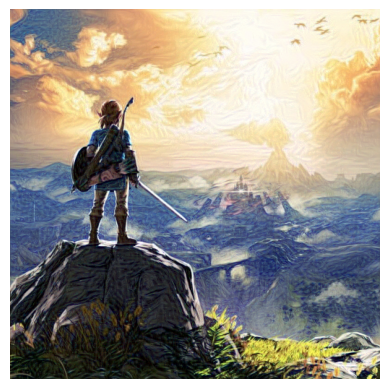

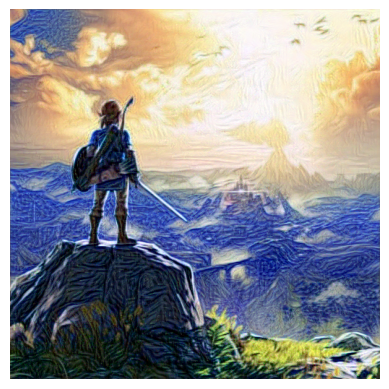

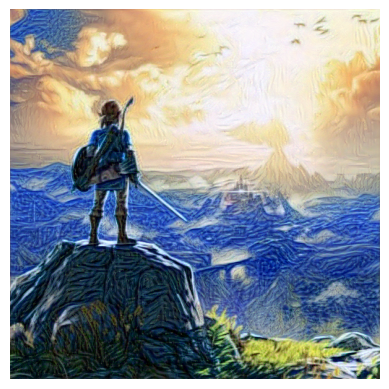

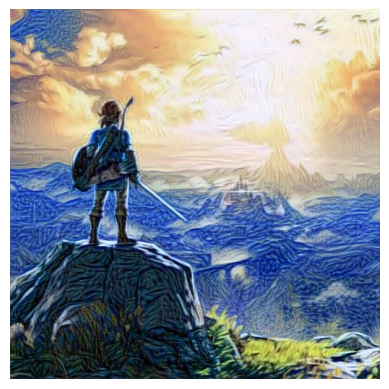

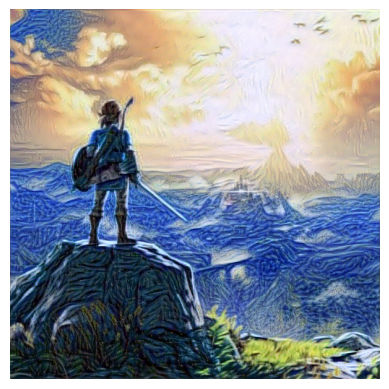

...

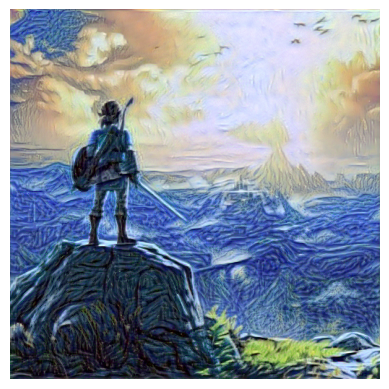

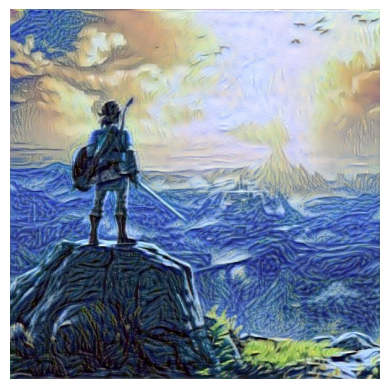

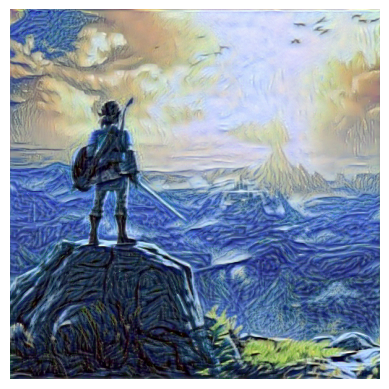

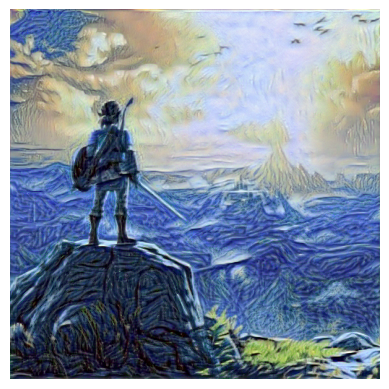

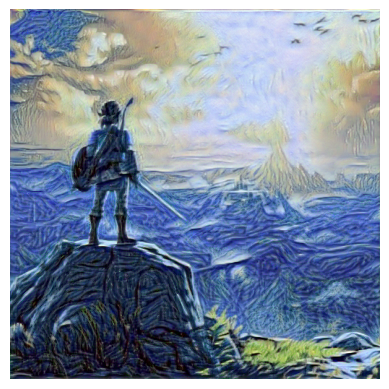

In [23]:
num_steps      = 100                # Number of optimization steps to run
style_weight   = 1000000            # Weight for the style loss (high to prioritize style)
content_weight = 1                  # Weight for the content loss (low to prioritize style)

run = [0]                             # Initialize a list to track the step number
style_score_list = []                 # List to store style loss values during optimization
content_score_list = []               # List to store content loss values during optimization

while run[0] <= num_steps:            # Loop through the optimization process
    def closure():
        # correct the values of updated input image
        
        # Ensure the input image has pixel values in the range [0, 1]
        with torch.no_grad():
            input_img.clamp_(0, 1)

        # Reset the gradients of the optimizer
        optimizer.zero_grad()
        
        # Pass the input image through the model to compute the losses
        model(input_img)

        # Initialize the style and content score
        style_score = 0
        content_score = 0

        # Add up the individual style losses from each style layer
        for sl in style_losses:
            style_score += sl.loss
        
        # Add up the individual content losses
        for cl in content_losses:
            content_score += cl.loss

        # Apply the style and content weights to the respective losses
        style_score *= style_weight
        content_score *= content_weight

        # Store the current values of the losses
        style_score_list.append(style_score.item())
        content_score_list.append(content_score.item())

        # Combine the style and content losses to get the total loss
        loss = style_score + content_score

        # Perform backpropagation to calculate gradients
        loss.backward()

        # Increment the step counter
        run[0] += 1

        # Display the current state of the image every 10 steps
        if run[0] % 10 == 0:
            plt.imshow(input_img.detach().cpu().squeeze(0).permute(1, 2, 0))  # Convert to a format for display
            plt.axis('off')  # Hide axes for better visualization
            plt.show()

        # Return the combined loss for optimizer step
        return style_score + content_score

    # Perform the optimization step using the closure function
    optimizer.step(closure)

# After optimization loop ends, ensure input image is within the [0, 1] range
with torch.no_grad():
    input_img.clamp_(0, 1)


### _Loss trajectories_

🗒️ **Task:** Write code below to plot the style and content scores in `style_score_list` and `content_score_list`, respectively.

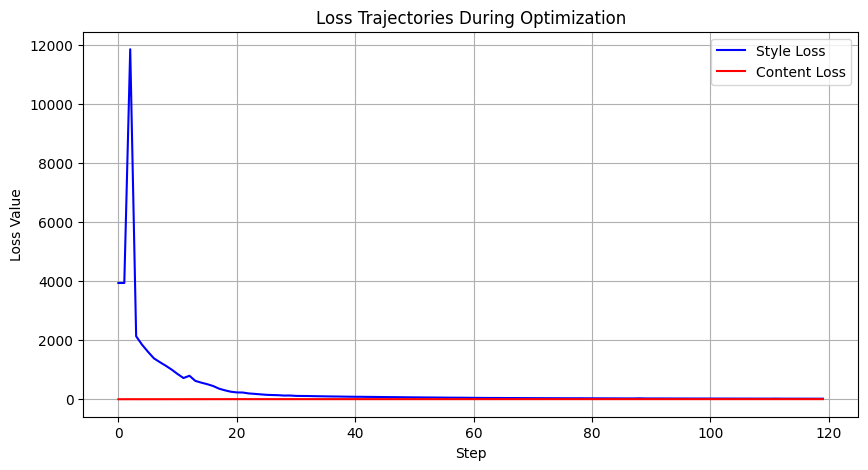

In [24]:
# Plot the style loss trajectory
plt.figure(figsize=(10, 5))
plt.plot(style_score_list, label="Style Loss", color="blue")
plt.plot(content_score_list, label="Content Loss", color="red")
plt.xlabel("Step")
plt.ylabel("Loss Value")
plt.title("Loss Trajectories During Optimization")
plt.legend()
plt.grid(True)
plt.show()

### _What if you choose a different content layer?_

🗒️ **Task:** Earlier we discussed how content and styles are represented by layers in VGG19 and use `content_layers_default` and `style_layers_default` to specify them. Now:

- Go back and change the layers used to specify content by choosing a different layer of your liking,
- Leave style layer info unchanged, 
- Run the whole thing again and post your result in the Teams channel

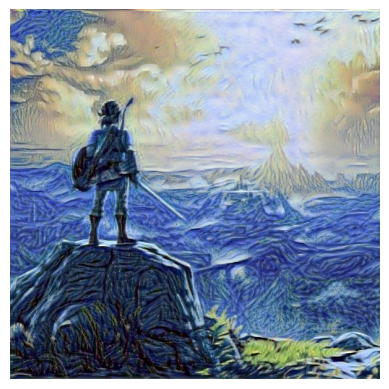

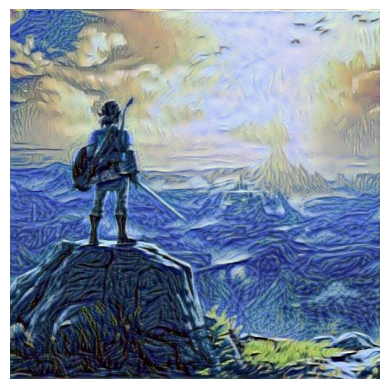

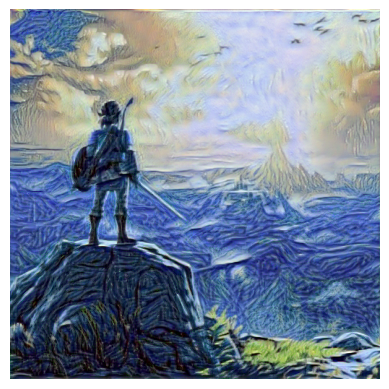

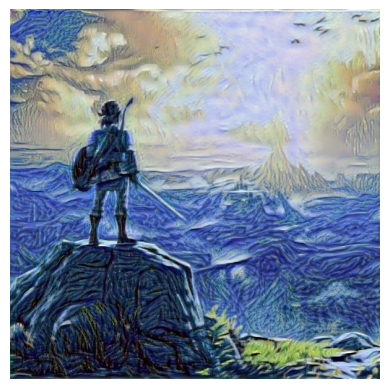

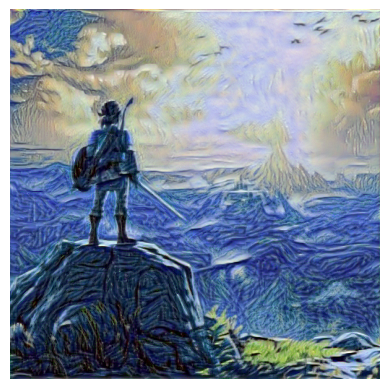

...

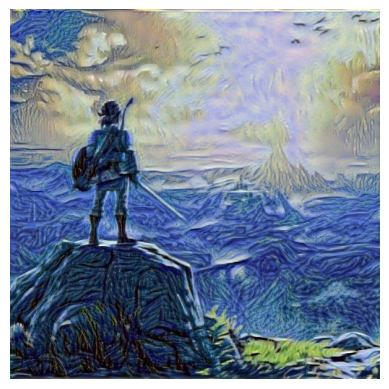

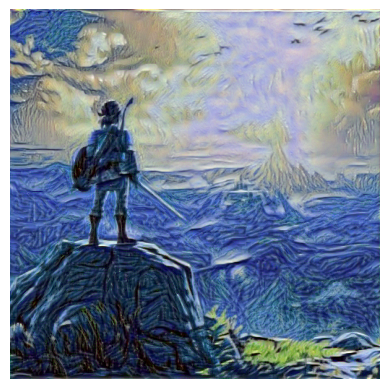

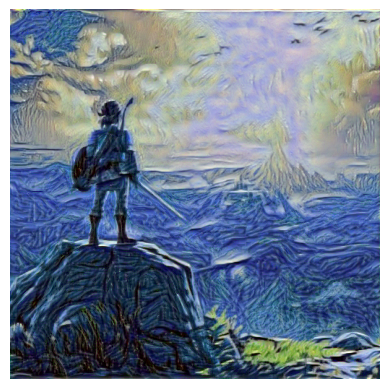

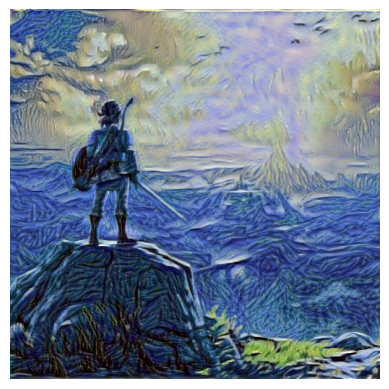

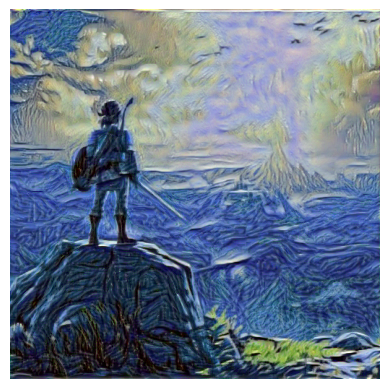

In [25]:
# Updated content layer choice
content_layers_default = ['conv_4']  

# Re-run the model with the new content layers
model, style_losses, content_losses = get_style_model_and_losses(
    cnn,
    normalization_mean,
    normalization_std,
    style_img,
    input_img,
    content_layers=content_layers_default,  # Use the new content layer
    style_layers=style_layers_default
)

# Perform optimization with the modified model
optimizer = get_input_optimizer(input_img)

num_steps = 100
style_weight = 1000000
content_weight = 1

run = [0]
style_score_list = []
content_score_list = []

while run[0] <= num_steps:
    def closure():
        # Correct the values of updated input image
        with torch.no_grad():
            input_img.clamp_(0, 1)

        optimizer.zero_grad()
        model(input_img)

        style_score = 0
        content_score = 0

        for sl in style_losses:
            style_score += sl.loss

        for cl in content_losses:
            content_score += cl.loss

        style_score *= style_weight
        content_score *= content_weight

        style_score_list.append(style_score.item())
        content_score_list.append(content_score.item())

        loss = style_score + content_score
        loss.backward()

        run[0] += 1
        if run[0] % 10 == 0:
            plt.imshow(input_img.detach().cpu().squeeze(0).permute(1, 2, 0))
            plt.axis('off')
            plt.show()

        return style_score + content_score

    optimizer.step(closure)

# Final adjustment
with torch.no_grad():
    input_img.clamp_(0, 1)


### _What if you choose different content and style weights?_

🗒️ **Task:** Earlier we set content and style weight to be 1 and 10000, respectively.

- Go back and the style weight to a value of your liking,
- Change the content layer back to `['conv_2']`,
- Run the whole thing again and post your result in the Teams channel.
  

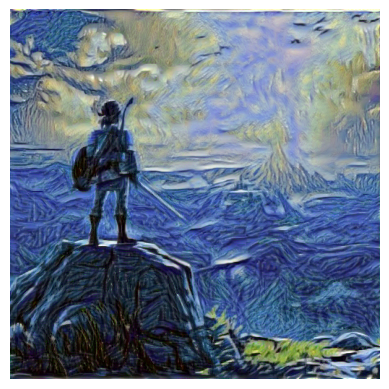

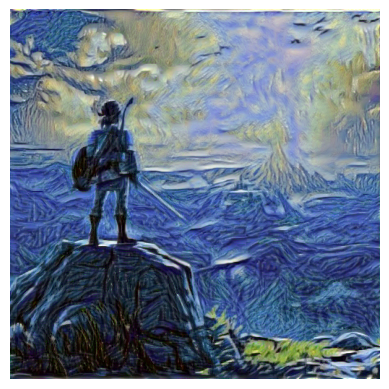

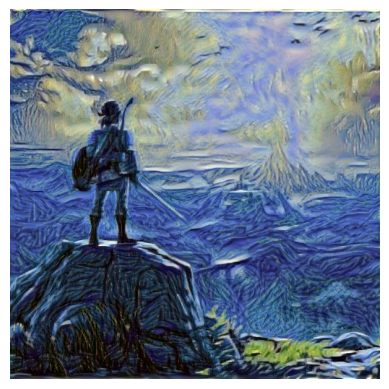

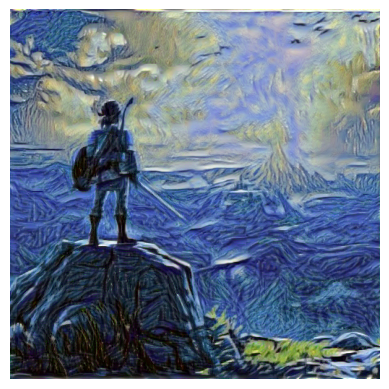

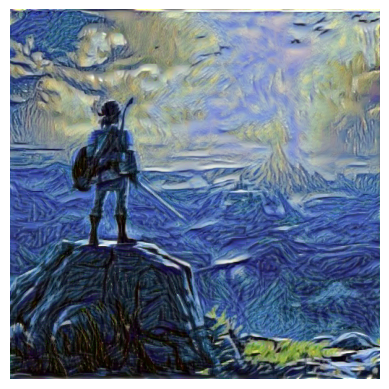

...

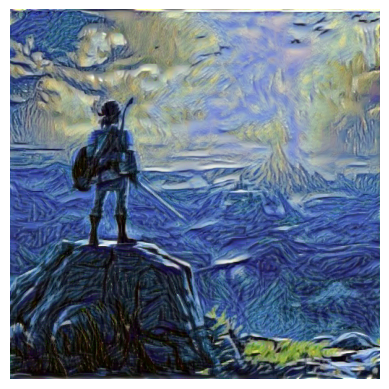

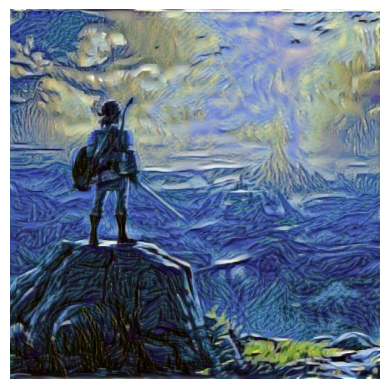

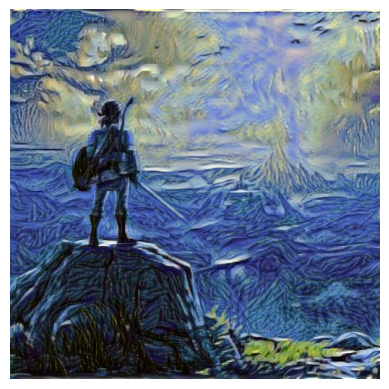

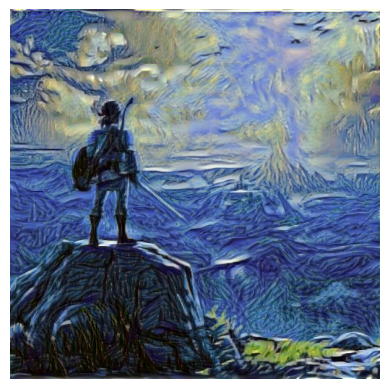

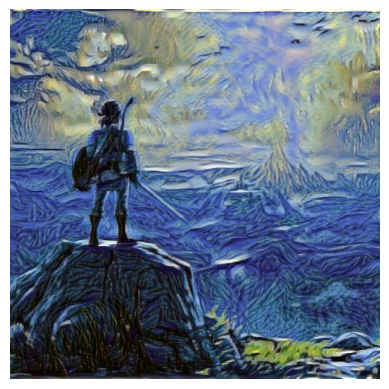

In [28]:
# Updated content layer choice and style weight
content_layers_default = ['conv_2']  # Set content layer back to conv_2
style_weight = 500000  # Adjusted style weight 
content_weight = 1  # Keep content weight at 1

# Re-run the model with the updated settings
model, style_losses, content_losses = get_style_model_and_losses(
    cnn,
    normalization_mean,
    normalization_std,
    style_img,
    input_img,
    content_layers=content_layers_default,  # Set content layer
    style_layers=style_layers_default
)

# Perform optimization with the modified model
optimizer = get_input_optimizer(input_img)

num_steps = 100

run = [0]
style_score_list = []
content_score_list = []

while run[0] <= num_steps:
    def closure():
        # Correct the values of updated input image
        with torch.no_grad():
            input_img.clamp_(0, 1)

        optimizer.zero_grad()
        model(input_img)

        style_score = 0
        content_score = 0

        for sl in style_losses:
            style_score += sl.loss

        for cl in content_losses:
            content_score += cl.loss

        style_score *= style_weight
        content_score *= content_weight

        style_score_list.append(style_score.item())
        content_score_list.append(content_score.item())

        loss = style_score + content_score
        loss.backward()

        run[0] += 1
        if run[0] % 10 == 0:
            plt.imshow(input_img.detach().cpu().squeeze(0).permute(1, 2, 0))
            plt.axis('off')
            plt.show()

        return style_score + content_score

    optimizer.step(closure)

# Final adjustment
with torch.no_grad():
    input_img.clamp_(0, 1)


## ___Put everything together___

### _Create a script for neural style transfer_

🗒️ **Task:** Create `script_neural_style_transfer.py` that will:

- Take the following parameters as arguments:
  - `content_url`: URL of a content image,
  - `style_url`: URL of a style image,
  - `content_layers_default`: a list of layer(s) representing content,
  - `style_layers_default`: a list of layer(s) representing style,
  - `num_steps`: number of optimization steps,
  - `style_weight`: weight for style loss,
  - `content_weight`: weight for content loss.
- For the rest of the parameters, use the values defined in cells above.
- Do not display intermediate images,
- Save the final style-transferred image.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.007935797..1.0338463].


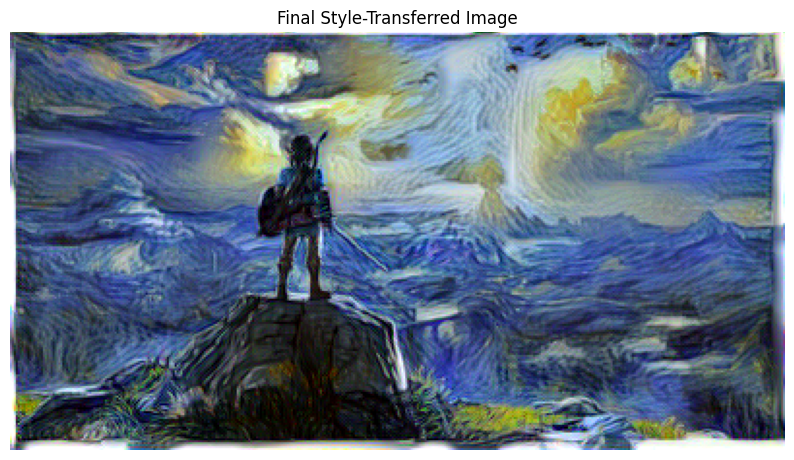

In [57]:
import torch
import torch.optim as optim
from torch import nn
from torchvision import transforms, models
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

# Utility function to load images from URLs
def load_image_from_url(url, max_size=400):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content)).convert("RGB")
    
    # Scale the image to the specified size while maintaining the aspect ratio
    max_dim = max(img.size)
    scale_factor = max_size / max_dim
    new_size = tuple([int(x * scale_factor) for x in img.size])
    img = img.resize(new_size, Image.LANCZOS)
    
    # Convert image to tensor
    img_tensor = transforms.ToTensor()(img).unsqueeze(0)
    return img_tensor

# Resize the images to match the content image size
def resize_image_to_target(content_img, style_img):
    style_img = transforms.Resize(content_img.shape[2:])(style_img)
    return style_img

# Set device (GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load content and style images
content_url = "https://cdn.wccftech.com/wp-content/uploads/2017/01/Zelda-Breath-of-the-Wild-screenshots6-1480x802.jpg"  # Replace with your content image URL
style_url = "https://m.media-amazon.com/images/I/71pzSa3-euL._AC_SL1000_.jpg"      # Replace with your style image URL

content_img = load_image_from_url(content_url).to(device)
style_img = load_image_from_url(style_url).to(device)

# Resize style image to match content image size
style_img = resize_image_to_target(content_img, style_img)

# Normalize images
def image_loader(image):
    return image.clone().detach().requires_grad_(True).to(device)

content_img = image_loader(content_img)
style_img = image_loader(style_img)

# Define the model, loss functions, and optimizer
cnn = models.vgg19(pretrained=True).features.to(device).eval()

# Define normalization values (same as used in the VGG model)
normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

# Normalization layer
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = mean
        self.std = std
    
    def forward(self, img):
        return (img - self.mean[None, :, None, None]) / self.std[None, :, None, None]

# Define the model with content and style losses
class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = target_feature.detach()
        self.loss = None

    def forward(self, x):
        gram_x = self.gram_matrix(x)
        gram_target = self.gram_matrix(self.target)
        self.loss = nn.functional.mse_loss(gram_x, gram_target)
        return x

    def gram_matrix(self, x):
        _, c, h, w = x.size()
        x = x.view(c, h * w)
        gram = torch.mm(x, x.t())
        return gram / (c * h * w)

class ContentLoss(nn.Module):
    def __init__(self, target_feature):
        super(ContentLoss, self).__init__()
        self.target = target_feature.detach()
        self.loss = None

    def forward(self, x):
        self.loss = nn.functional.mse_loss(x, self.target)
        return x

# Get model with style and content losses
def get_style_model_and_losses(cnn, normalization_mean, normalization_std, style_img, content_img, content_layers_default, style_layers_default):
    normalization = Normalization(normalization_mean, normalization_std).to(device)

    content_losses = []
    style_losses = []

    model = nn.Sequential(normalization)

    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = f"conv_{i}"
        elif isinstance(layer, nn.ReLU):
            name = f"relu_{i}"
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = f"pool_{i}"
        elif isinstance(layer, nn.BatchNorm2d):
            name = f"bn_{i}"

        model.add_module(name, layer)

        if name in style_layers_default:
            target_feature = model(style_img)
            style_loss = StyleLoss(target_feature)
            model.add_module(f"style_loss_{i}", style_loss)
            style_losses.append(style_loss)

        if name in content_layers_default:
            target_feature = model(content_img)
            content_loss = ContentLoss(target_feature)
            model.add_module(f"content_loss_{i}", content_loss)
            content_losses.append(content_loss)

    return model, style_losses, content_losses

# Set parameters for style transfer
content_layers_default = ['conv_4']  # Content layer
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']  # Style layers
num_steps = 500  # Number of optimization steps
style_weight = 1000000  # Weight for style loss
content_weight = 1  # Weight for content loss

# Get the model and losses
model, style_losses, content_losses = get_style_model_and_losses(
    cnn, normalization_mean, normalization_std, style_img, content_img, content_layers_default, style_layers_default)

# Optimizer for the input image
optimizer = optim.LBFGS([content_img])

# Perform the optimization process
style_score_list = []
content_score_list = []
run = [0]

while run[0] <= num_steps:
    def closure():
        content_img.data.clamp_(0, 1)
        optimizer.zero_grad()
        model(content_img)

        style_score = 0
        content_score = 0

        for sl in style_losses:
            style_score += sl.loss

        for cl in content_losses:
            content_score += cl.loss

        style_score *= style_weight
        content_score *= content_weight

        style_score_list.append(style_score.item())
        content_score_list.append(content_score.item())

        loss = style_score + content_score
        loss.backward()

        run[0] += 1

        return style_score + content_score

    optimizer.step(closure)

# Final image
final_img = content_img.detach().cpu().squeeze(0).permute(1, 2, 0)
plt.figure(figsize=(10, 10))
plt.imshow(final_img)
plt.axis("off")
plt.title("Final Style-Transferred Image")
plt.show()


## Congratulations, you're done!

Submit this assignment by uploading your notebook to the course Desire2Learn web page.  Go to the "In-Class Assignments" folder, find the appropriate submission link, and upload everything there. Make sure your name is on it!

---

© 2024 Michigan State University. This material was created for the Department of Computational Mathematics, Science and Engineering (CMSE) at Michigan State University.